In [129]:
from itertools import islice
from typing import Callable

import matplotlib.pyplot as plt
import numpy as np
import torch as t
import torch.nn as nn
import torch.nn.functional as F
from beartype import beartype as typed
from beartype.door import die_if_unbearable as assert_type
from datasets import load_dataset
from einops import einops as ein
from jaxtyping import Bool, Float, Int
from torch import Tensor as TT
from transformers import AutoModelForCausalLM, AutoTokenizer

from activation_analysis import fit_linear, fit_module
from utils import ls, sh
from tqdm import tqdm

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
model = AutoModelForCausalLM.from_pretrained("Mlxa/brackets-nested")
tokenizer = AutoTokenizer.from_pretrained("Mlxa/brackets-nested")
dataset = load_dataset("Mlxa/nested", streaming=True)["train"]

In [8]:
from utils import sh, ls
from activation_analysis import (
    input_output_mapping,
    fit_linear,
    eval_module,
    Residual,
    PrefixMean,
    get_activations,
    squeeze_batch,
)


@typed
def get_prompts(n: int) -> list[str]:
    return [elem["text"] for elem in islice(dataset, n)]

In [304]:
from sparse_autoencoders import fit_sae, SparseAutoEncoder

layer = "transformer.h.2"
# activation_data = t.load("activations/L1_mlp.pt")

In [305]:
prefixes: list[str] = []
activations: list[Float[TT, "d"]] = []

for prompt in tqdm(get_prompts(4000)):
    length = np.random.randint(8, 16)
    tokens = tokenizer.tokenize(prompt)[:length]
    prefixes.append(" ".join(tokens))
    _, full_activations = get_activations(model, tokenizer, prefixes[-1])
    activations.append(squeeze_batch(full_activations[layer])[-1].detach())

100%|██████████| 4000/4000 [01:00<00:00, 66.53it/s]


In [249]:
position_embeddings = model.transformer.wpe(t.arange(512)).detach()

In [306]:
@typed
def get_known_features(prompt: str) -> Float[TT, "d"]:
    tokens = t.tensor(tokenizer.encode(prompt))
    assert max(tokens) < len(tokenizer) - 2

    max_balance, max_token, n = 20, 500, len(tokens)
    last_token = t.zeros(max_token)
    token_ratio = t.zeros(max_token)
    balance_bins = t.zeros(max_balance)

    last_token[tokens[-1]] = 1
    token_ratio = t.scatter_add(token_ratio, 0, tokens, t.ones(n)) / n
    balance_bins[min((2 * (tokens % 2 == 0) - 1).sum(), max_balance - 1)] = 1

    pe = position_embeddings[n - 1]

    return t.cat([last_token, token_ratio, balance_bins, pe], dim=0)

In [307]:
K = t.stack([get_known_features(prefix) for prefix in prefixes])
A = t.stack(activations)
print(sh(K), sh(A))

[4000, 1276] [4000, 256]


In [308]:
from sklearn.metrics import r2_score

val_size = 100
K2A = fit_linear(K[:-val_size], A[:-val_size], reg="l2", alpha=1e-8)
R = (A - K2A(K)).detach()
print("baseline mse", A.square().mean().item())
print("train mse", R[:-val_size].square().mean().item())
print("val mse", R[-val_size:].square().mean().item())
print()
print("train r2", r2_score(A[:-val_size], K2A(K[:-val_size]).detach()))
print("val r2", r2_score(A[-val_size:], K2A(K[-val_size:]).detach()))

baseline mse 296.3565673828125
train mse 5.166474342346191
val mse 9.38241958618164

train r2 0.9349181409032468
val r2 0.8685658725840102


In [326]:
sae = SparseAutoEncoder(256, 512)

In [310]:
others = [SparseAutoEncoder(256, d) for d in [32, 128]]

In [314]:
for other in others:
    fit_sae(other, R, lr=1e-3, l1=0.1, alpha=1e-4, epochs=100)

  0%|          | 0/100 [00:00<?, ?it/s,  loss=0.08, nonzero=20.17 / 32, nonorth=0.02]

100%|██████████| 100/100 [00:05<00:00, 16.76it/s,  loss=0.01, nonzero=69.74 / 128, nonorth=0.01]


In [331]:
fit_sae(sae, R, lr=1e-3, l1=0.3, alpha=1e-6, epochs=100)

100%|██████████| 100/100 [00:12<00:00,  8.02it/s,  loss=0.00, nonzero=181.00 / 512, nonorth=0.00]


In [346]:
import plotly.express as px

for ae in [sae] + others:
    perm = t.argsort(-t.norm(ae.decoder, dim=1))
    covar = (ae.decoder[perm] @ ae.decoder[perm].T).clip(-2, 2)
    px.imshow(covar.detach()).show()

# pairs = []
# for i in range(covar.shape[0]):
#     for j in range(covar.shape[1]):
#         if i < j and covar[i, j] < -0.5:
#             print(covar[i, j])
#             assert covar[i, j] < -0.7
#             pairs.append((i, j))

In [347]:
with t.no_grad():
    some_activations = A
    guess = sae.encode(some_activations)
    other_guesses = [other.encode(some_activations) for other in others]

In [348]:
from sparse_autoencoders import max_cosine_similarity

sims = [max_cosine_similarity(guess, other) for other in other_guesses]
mean_sim = sum(sims) / len(sims)
print(ls(sims[0].mean()), ls(sims[0]))
print(ls(sims[1].mean()), ls(sims[1]))

0.58 [ 0.86 0.83 0.87 0.17 0.75 0.72 0.55 0.87 0.95 0.86 0.87 0.39 0.53 0.68 0.00 0.78 0.92 0.40 0.21 0.81 0.18 0.89 0.38 0.82 0.21 0.88 0.62 0.10 0.70 0.78 0.72 0.00 0.44 0.32 0.31 0.15 0.14 0.39 0.44 0.13 0.96 0.48 0.62 0.31 0.84 0.27 0.72 0.75 0.80 0.89 0.50 0.66 0.78 0.80 0.79 0.14 0.94 0.81 0.63 0.75 0.34 0.09 0.12 0.33 0.08 0.85 0.27 0.83 0.71 0.23 0.00 0.44 0.86 0.93 0.79 0.39 0.56 0.38 0.04 0.07 0.11 0.14 0.96 0.68 0.67 0.00 0.38 0.70 0.00 0.61 0.23 0.80 0.92 0.45 0.22 0.79 0.32 0.31 0.10 0.33 0.70 0.38 0.84 0.91 0.37 0.74 0.12 0.21 0.70 0.00 0.91 0.85 0.89 0.71 0.91 0.22 0.91 0.92 0.90 0.86 0.84 0.92 0.70 0.24 0.31 0.80 0.44 0.95 0.93 0.80 0.83 0.79 0.80 0.36 0.15 0.85 0.13 0.78 0.58 0.78 0.47 0.73 0.18 0.09 0.68 0.80 0.82 0.81 0.22 0.35 0.69 0.87 0.67 0.19 0.27 0.80 0.82 0.85 0.13 0.23 0.93 0.87 0.81 0.30 0.95 0.91 0.56 0.48 0.57 0.69 0.20 0.34 0.84 0.72 0.59 0.78 0.95 0.22 0.20 0.94 0.76 0.41 0.88 0.47 0.26 0.12 0.23 0.34 0.96 0.23 0.14 0.79 0.92 0.83 0.13 0.81 0.76 0.90 0.1

In [335]:
from activation_analysis import compressed_activations
from language_modeling import prompt_from_template, generate_sample, get_logprobs
import plotly.express as px
from tqdm import tqdm


compressed: list[Float[TT, "d"]] = []

for i_prefix, prefix in enumerate(tqdm(prefixes)):
    # res = compressed_activations(model, tokenizer, prefix, {layer: sae})[layer]
    res = sae.encode(R[i_prefix]).detach()
    assert_type(res, Float[TT, "d"])
    compressed.append(res)

100%|██████████| 4000/4000 [00:00<00:00, 13044.36it/s]


In [336]:
suffixes: list[str] = []
for i_prefix, prefix in enumerate(tqdm(prefixes)):
    logprobs = get_logprobs(model, tokenizer, prefix)
    next_tokens = t.multinomial(logprobs.roll(-1, dims=0).exp(), 1).squeeze().tolist()
    suffixes.append(tokenizer.convert_ids_to_tokens(next_tokens[-1]))

100%|██████████| 4000/4000 [00:36<00:00, 110.67it/s]


In [337]:
@typed
def show_activations(activations: Float[TT, "n d"], perm: Int[TT, "k"]) -> None:
    fig = px.imshow(
        activations[:, perm],
        color_continuous_scale=px.colors.diverging.RdBu,
        labels={"x": "Dimension", "y": "Prompt", "color": "Activation"},
        x=[str(elem.item()) for elem in perm],
        # y=prefixes,
        # zmin=-1,
        # zmax=1,
    )
    fig.show()


stacked: Float[TT, "n_samples d"] = t.stack(compressed)
stds = stacked.std(dim=0)
std_argsort = t.argsort(-stds)
# stacked -= stacked.mean(dim=0, keepdim=True)
# stacked /= stacked.norm(dim=0, keepdim=True)
show_activations(stacked[:100], perm=std_argsort)

In [338]:
normed = stacked[:, std_argsort[:20]].T.clone()
normed -= normed.mean(dim=1, keepdim=True)
normed /= normed.norm(dim=1, keepdim=True).max(t.tensor(1e-8))
covar = normed @ normed.T
px.imshow(covar.detach()).show()

In [339]:
stacked = t.stack(compressed)
for pos, i_prefix in enumerate(std_argsort[:]):
    print(
        f"{pos}) dim: {i_prefix.item()}\tstd: {ls(stds[i_prefix])}\tsim: {ls(sims[0][i_prefix])}\t other sim: {ls(sims[1][i_prefix])}"
    )

0) dim: 407	std: 7.08	sim: 0.94	 other sim: 1.00
1) dim: 316	std: 5.85	sim: 0.00	 other sim: 0.00
2) dim: 123	std: 5.40	sim: 0.24	 other sim: 0.21
3) dim: 180	std: 5.18	sim: 0.76	 other sim: 0.88
4) dim: 225	std: 5.16	sim: 0.61	 other sim: 0.84
5) dim: 165	std: 5.16	sim: 0.91	 other sim: 0.98
6) dim: 344	std: 5.10	sim: 0.60	 other sim: 0.76
7) dim: 255	std: 5.05	sim: 0.87	 other sim: 0.93
8) dim: 460	std: 5.04	sim: 0.69	 other sim: 0.67
9) dim: 487	std: 5.01	sim: 0.54	 other sim: 0.57
10) dim: 113	std: 4.97	sim: 0.71	 other sim: 0.67
11) dim: 101	std: 4.93	sim: 0.38	 other sim: 0.39
12) dim: 345	std: 4.90	sim: 0.57	 other sim: 0.65
13) dim: 259	std: 4.87	sim: 0.59	 other sim: 0.57
14) dim: 320	std: 4.87	sim: 0.65	 other sim: 0.71
15) dim: 157	std: 4.81	sim: 0.85	 other sim: 0.84
16) dim: 398	std: 4.79	sim: 0.62	 other sim: 0.57
17) dim: 150	std: 4.78	sim: 0.69	 other sim: 0.73
18) dim: 223	std: 4.71	sim: 0.53	 other sim: 0.56
19) dim: 384	std: 4.69	sim: 0.35	 other sim: 0.37
20) dim: 2

In [340]:
from activation_analysis import feature_effect

short_prompts = [
    ("<10 <11 <12 12> 11> 10>", 1),
    ("<3 <4 <5 5> 4> 3>", 1),
    ("<8 <2 <7 7> 2> 8>", 1),
    ("<10 <11 <12 12> 11> 10>", 2),
    ("<3 <4 <5 5> 4> 3>", 2),
]

inspected_direction = 407

for prompt, position in short_prompts:
    eps = 0.01

    effect = feature_effect(
        model,
        tokenizer,
        prompt,
        position,
        directions={layer: (sae, inspected_direction)},
        eps=eps,
    )

    d = effect.base[f"lm_head"] * 0 + effect.diff[f"lm_head"]
    print(f"{prompt} (pos={position})")

    r = 0.02 * eps
    window = 50
    px.imshow(
        d[:, :window].detach(),
        zmin=-r,
        zmax=r,
        color_continuous_scale=px.colors.diverging.RdBu,
        x=[tokenizer.decode(i) for i in range(window)],
    ).show()

    # window = 500
    # px.imshow(
    #     d[:, 1:window:2].detach(),
    #     color_continuous_scale=px.colors.diverging.RdBu,
    #     x=[tokenizer.decode(2 * i + 1) for i in range(window//2)],
    # ).show()

<10 <11 <12 12> 11> 10> (pos=1)


<3 <4 <5 5> 4> 3> (pos=1)


<8 <2 <7 7> 2> 8> (pos=1)


<10 <11 <12 12> 11> 10> (pos=2)


<3 <4 <5 5> 4> 3> (pos=2)


In [341]:
values = t.tensor([a[inspected_direction] for a in compressed])
perm = values.argsort()

for i_prefix in perm[::30]:
    print(ls(values[i_prefix]), "   \t", prefixes[i_prefix], "#", suffixes[i_prefix])

0.00    	 <58 58> <130 130> <245 245> <163 163> <119 <99 99> 119> # <153
0.00    	 <65 65> <160 <120 120> 160> <167 167> <79 # 79>
0.00    	 <78 78> <192 192> <204 204> <17 17> # <20
0.00    	 <13 <91 91> 13> <219 219> <159 159> <222 222> <45 45> # <151
0.00    	 <39 39> <153 <29 <113 <18 18> 113> <229 <210 210> # <141
0.00    	 <210 210> <165 165> <87 87> <58 58> <181 181> <189 <146 146> 189> <232 # 232>
0.00    	 <214 214> <154 <148 148> 154> <18 18> <240 # 240>
0.00    	 <248 248> <43 43> <220 220> <136 136> <107 107> <112 # <53
0.00    	 <1 1> <58 <67 67> 58> <78 <124 124> <167 <47 <91 <60 <137 # 137>
0.00    	 <52 52> <207 <26 26> 207> <238 238> # <219
0.00    	 <91 91> <91 91> <110 <233 <180 <233 233> 180> <56 56> 233> 110> <57 # 57>
0.00    	 <60 <230 230> <115 115> <81 <76 76> <3 # 3>
0.00    	 <105 105> <232 232> <140 140> <176 176> <185 <71 # <148
0.00    	 <5 <34 34> 5> <80 80> <232 232> <195 195> # <120
0.00    	 <46 46> <97 <145 145> <17 17> <211 # <108
0.00    	 <141 <171

segment 0: 0.00, 0.00
last open = 0.448, next open = 0.54, balance: [0. 1. 1. 2. 4.] mean = 1.752, length = [ 8.  9. 12. 14. 15.] mean = 11.464
prefix (full) 2866 [('<249', 0.005), ('<123', 0.005), ('<207', 0.005), ('<181', 0.004), ('<157', 0.004), ('<16', 0.004), ('123>', 0.004), ('<173', 0.004), ('<165', 0.004), ('<119', 0.004)]
prefix (last) 250 [('<16', 0.012), ('116>', 0.012), ('115>', 0.012), ('238>', 0.008), ('177>', 0.008), ('<212', 0.008), ('50>', 0.008), ('<166', 0.008), ('123>', 0.008), ('<207', 0.008)]
suffix (first) 250 [('35>', 0.012), ('<136', 0.012), ('<162', 0.012), ('142>', 0.012), ('240>', 0.012), ('119>', 0.012), ('<114', 0.012), ('<159', 0.012), ('<4', 0.012), ('204>', 0.012)]


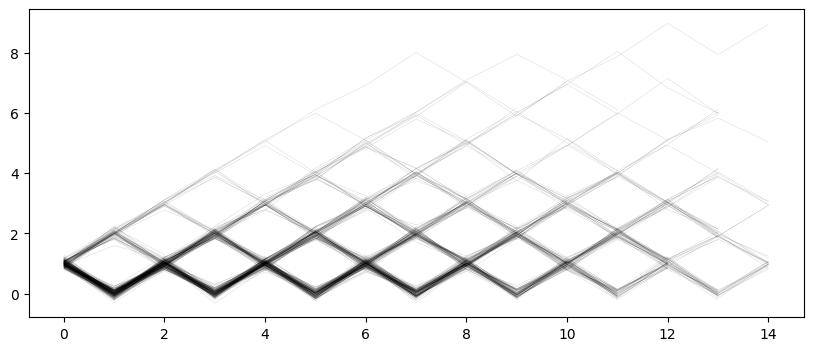


segment 1: 0.00, 0.00
last open = 0.512, next open = 0.552, balance: [0. 1. 1. 2. 4.] mean = 1.632, length = [ 8. 10. 12. 14. 15.] mean = 11.624
prefix (full) 2906 [('<110', 0.006), ('110>', 0.005), ('<164', 0.004), ('<64', 0.004), ('<248', 0.004), ('<89', 0.004), ('<132', 0.004), ('64>', 0.004), ('<72', 0.004), ('<54', 0.004)]
prefix (last) 250 [('23>', 0.02), ('119>', 0.012), ('<211', 0.012), ('165>', 0.008), ('145>', 0.008), ('203>', 0.008), ('<181', 0.008), ('<228', 0.008), ('<4', 0.008), ('<222', 0.008)]
suffix (first) 250 [('<38', 0.016), ('181>', 0.012), ('99>', 0.012), ('<218', 0.012), ('<23', 0.012), ('<83', 0.012), ('<184', 0.012), ('<37', 0.008), ('203>', 0.008), ('89>', 0.008)]


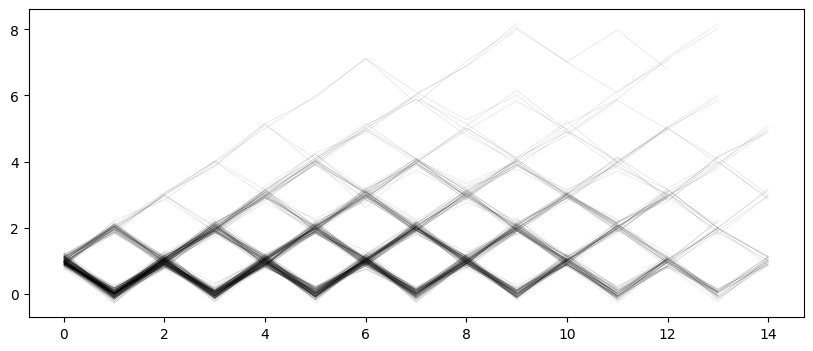


segment 2: 0.00, 0.00
last open = 0.508, next open = 0.484, balance: [0. 1. 1. 3. 4.] mean = 1.772, length = [ 8. 10. 12. 13. 15.] mean = 11.588
prefix (full) 2897 [('<34', 0.005), ('<39', 0.004), ('39>', 0.004), ('<45', 0.004), ('<121', 0.004), ('<154', 0.004), ('<236', 0.004), ('<69', 0.004), ('<29', 0.004), ('<81', 0.004)]
prefix (last) 250 [('<96', 0.012), ('29>', 0.012), ('<128', 0.012), ('180>', 0.012), ('<201', 0.008), ('236>', 0.008), ('44>', 0.008), ('<214', 0.008), ('204>', 0.008), ('235>', 0.008)]
suffix (first) 250 [('<225', 0.012), ('179>', 0.012), ('<24', 0.012), ('<42', 0.012), ('97>', 0.012), ('<245', 0.012), ('102>', 0.012), ('4>', 0.008), ('22>', 0.008), ('<63', 0.008)]


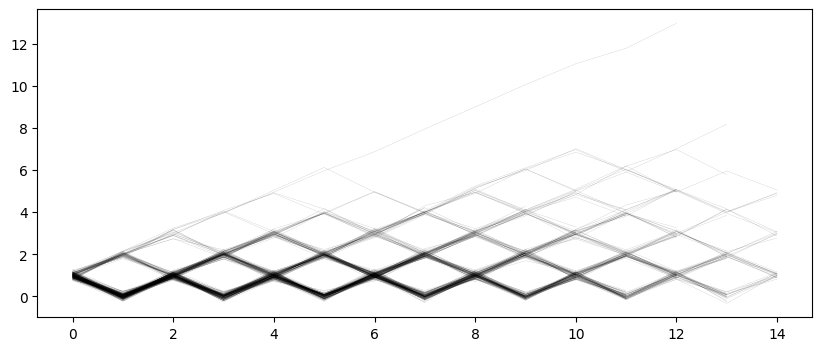


segment 3: 0.00, 0.00
last open = 0.532, next open = 0.544, balance: [0. 1. 1. 3. 4.] mean = 1.744, length = [ 9. 10. 11. 13. 15.] mean = 11.456
prefix (full) 2864 [('<215', 0.005), ('<53', 0.005), ('<212', 0.005), ('<44', 0.005), ('<50', 0.005), ('<69', 0.005), ('<72', 0.004), ('<153', 0.004), ('<240', 0.004), ('<249', 0.004)]
prefix (last) 250 [('89>', 0.016), ('53>', 0.012), ('<232', 0.012), ('<68', 0.012), ('246>', 0.012), ('76>', 0.012), ('<43', 0.012), ('<106', 0.008), ('116>', 0.008), ('<60', 0.008)]
suffix (first) 250 [('<97', 0.016), ('<52', 0.012), ('<1', 0.012), ('<149', 0.012), ('<215', 0.012), ('232>', 0.012), ('43>', 0.012), ('<211', 0.012), ('<6', 0.012), ('<15', 0.012)]


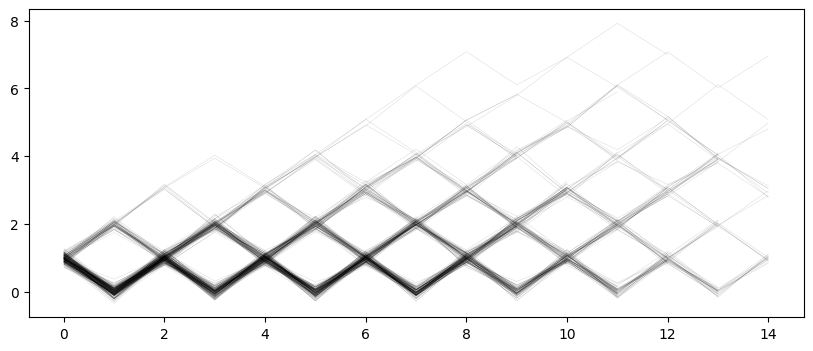


segment 4: 0.00, 0.00
last open = 0.556, next open = 0.604, balance: [0. 1. 1. 3. 4.] mean = 1.808, length = [ 8.  9. 11. 14. 15.] mean = 11.512
prefix (full) 2878 [('<104', 0.005), ('<7', 0.005), ('104>', 0.005), ('<32', 0.005), ('<213', 0.004), ('<2', 0.004), ('<157', 0.004), ('<117', 0.004), ('<20', 0.004), ('<92', 0.004)]
prefix (last) 250 [('<32', 0.016), ('195>', 0.012), ('<243', 0.012), ('<95', 0.012), ('<84', 0.012), ('<56', 0.012), ('7>', 0.012), ('143>', 0.012), ('<117', 0.012), ('<114', 0.008)]
suffix (first) 250 [('84>', 0.016), ('<145', 0.012), ('<42', 0.012), ('<203', 0.012), ('<233', 0.012), ('117>', 0.012), ('<239', 0.012), ('114>', 0.008), ('<194', 0.008), ('<10', 0.008)]


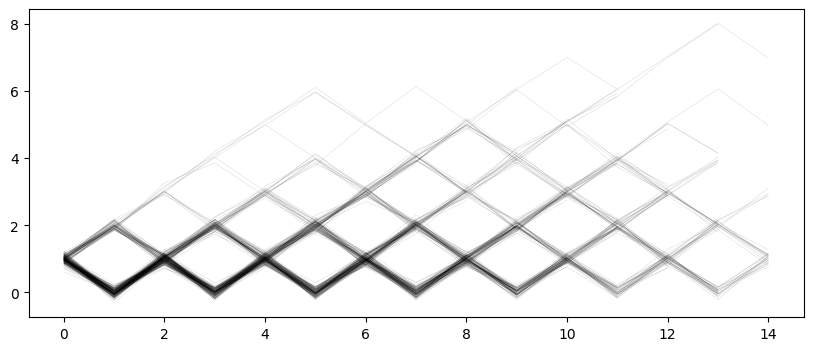


segment 5: 0.00, 0.00
last open = 0.556, next open = 0.524, balance: [0. 1. 1. 2. 4.] mean = 1.792, length = [ 8. 10. 12. 13. 15.] mean = 11.704
prefix (full) 2926 [('<170', 0.006), ('170>', 0.005), ('<230', 0.005), ('<59', 0.004), ('<125', 0.004), ('<223', 0.004), ('<76', 0.004), ('<19', 0.004), ('<129', 0.004), ('<193', 0.004)]
prefix (last) 250 [('<250', 0.02), ('<229', 0.012), ('127>', 0.012), ('<140', 0.012), ('<19', 0.008), ('210>', 0.008), ('234>', 0.008), ('53>', 0.008), ('<149', 0.008), ('64>', 0.008)]
suffix (first) 250 [('<78', 0.016), ('<243', 0.012), ('228>', 0.012), ('223>', 0.012), ('19>', 0.008), ('176>', 0.008), ('<18', 0.008), ('<65', 0.008), ('86>', 0.008), ('<166', 0.008)]


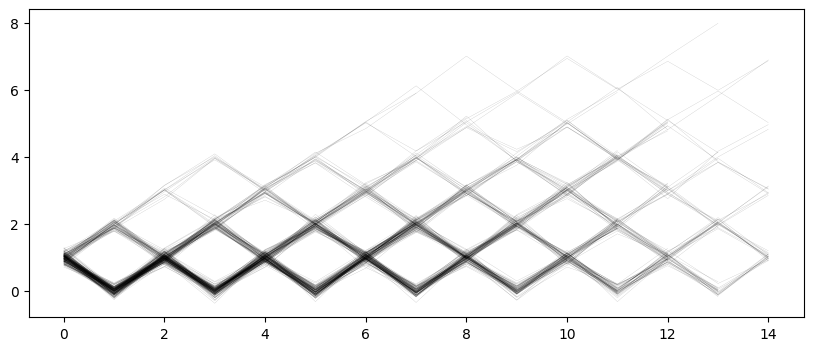


segment 6: 0.00, 0.00
last open = 0.468, next open = 0.548, balance: [0. 1. 1. 2. 4.] mean = 1.7, length = [ 8.  9. 12. 13. 15.] mean = 11.444
prefix (full) 2861 [('<203', 0.005), ('<8', 0.005), ('8>', 0.005), ('<209', 0.004), ('<145', 0.004), ('<205', 0.004), ('<220', 0.004), ('<129', 0.004), ('<37', 0.004), ('<242', 0.004)]
prefix (last) 250 [('207>', 0.016), ('100>', 0.016), ('<43', 0.012), ('166>', 0.012), ('229>', 0.012), ('<130', 0.012), ('25>', 0.012), ('217>', 0.012), ('<58', 0.012), ('<213', 0.012)]
suffix (first) 250 [('43>', 0.012), ('<130', 0.012), ('<81', 0.012), ('<197', 0.012), ('<193', 0.012), ('<19', 0.012), ('<7', 0.008), ('<227', 0.008), ('27>', 0.008), ('209>', 0.008)]


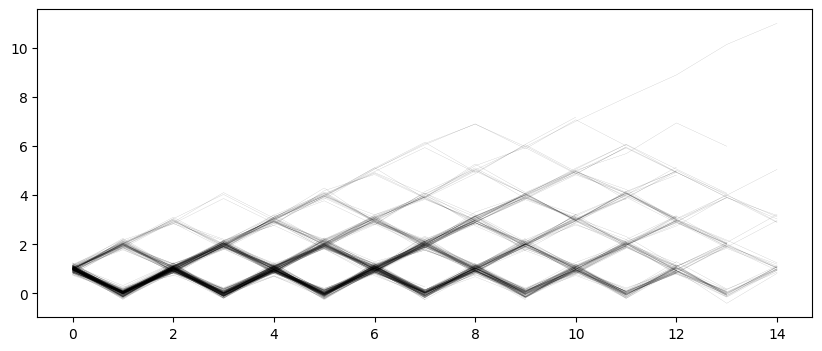


segment 7: 0.00, 0.00
last open = 0.484, next open = 0.52, balance: [0. 1. 1. 2. 4.] mean = 1.688, length = [ 8. 10. 12. 13. 15.] mean = 11.584
prefix (full) 2896 [('<116', 0.006), ('<196', 0.005), ('<192', 0.004), ('<63', 0.004), ('116>', 0.004), ('<53', 0.004), ('<133', 0.004), ('<150', 0.004), ('<18', 0.004), ('<37', 0.004)]
prefix (last) 250 [('18>', 0.016), ('116>', 0.012), ('<73', 0.012), ('<189', 0.012), ('152>', 0.012), ('146>', 0.012), ('<78', 0.008), ('<232', 0.008), ('<113', 0.008), ('<60', 0.008)]
suffix (first) 250 [('<199', 0.016), ('<237', 0.012), ('73>', 0.012), ('<13', 0.012), ('<92', 0.012), ('<204', 0.012), ('84>', 0.012), ('204>', 0.012), ('<242', 0.008), ('9>', 0.008)]


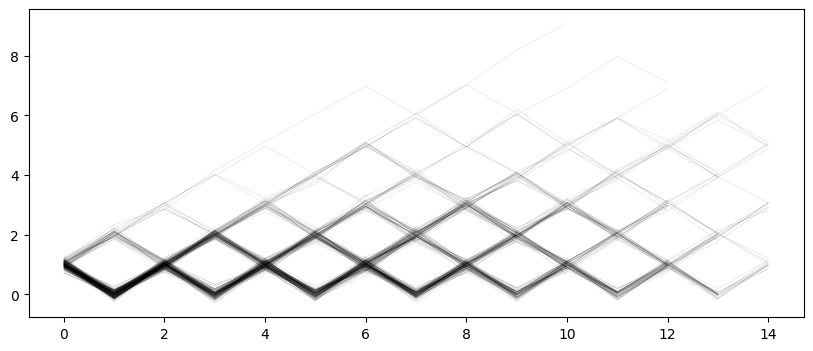


segment 8: 0.00, 0.00
last open = 0.528, next open = 0.548, balance: [0. 1. 1. 3. 4.] mean = 1.76, length = [ 8. 10. 12. 14. 15.] mean = 11.656
prefix (full) 2914 [('<124', 0.005), ('<63', 0.005), ('<138', 0.005), ('<49', 0.005), ('<40', 0.004), ('<221', 0.004), ('<205', 0.004), ('138>', 0.004), ('<84', 0.004), ('<62', 0.004)]
prefix (last) 250 [('125>', 0.016), ('<49', 0.012), ('<105', 0.012), ('<3', 0.012), ('<124', 0.012), ('<38', 0.012), ('<247', 0.012), ('<159', 0.012), ('<144', 0.012), ('63>', 0.012)]
suffix (first) 250 [('<144', 0.016), ('<17', 0.012), ('166>', 0.012), ('3>', 0.012), ('<93', 0.012), ('124>', 0.012), ('<173', 0.012), ('38>', 0.012), ('<24', 0.008), ('33>', 0.008)]


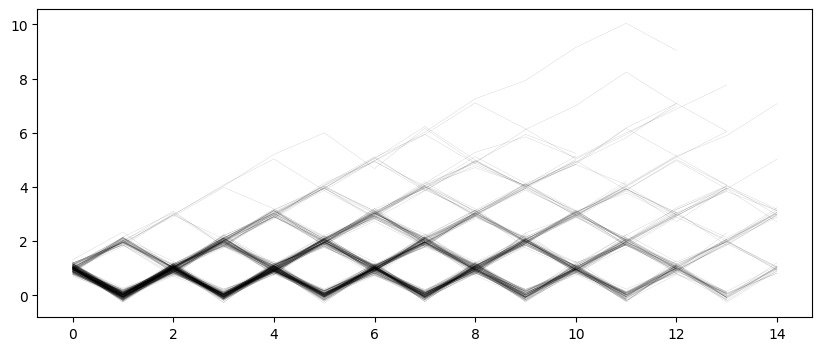


segment 9: 0.02, 1.10
last open = 0.64, next open = 0.504, balance: [0. 1. 2. 3. 4.] mean = 2.012, length = [ 9.  10.  11.5 14.  15. ] mean = 11.564
prefix (full) 2891 [('<194', 0.006), ('<106', 0.005), ('<243', 0.004), ('<8', 0.004), ('<146', 0.004), ('<158', 0.004), ('<21', 0.004), ('21>', 0.004), ('<173', 0.004), ('<231', 0.004)]
prefix (last) 250 [('<225', 0.016), ('226>', 0.012), ('<157', 0.012), ('<46', 0.012), ('<7', 0.012), ('172>', 0.012), ('<22', 0.012), ('<173', 0.012), ('<219', 0.008), ('<201', 0.008)]
suffix (first) 250 [('<205', 0.012), ('29>', 0.012), ('225>', 0.012), ('<187', 0.012), ('<105', 0.012), ('125>', 0.012), ('22>', 0.012), ('<168', 0.012), ('<93', 0.012), ('<111', 0.008)]


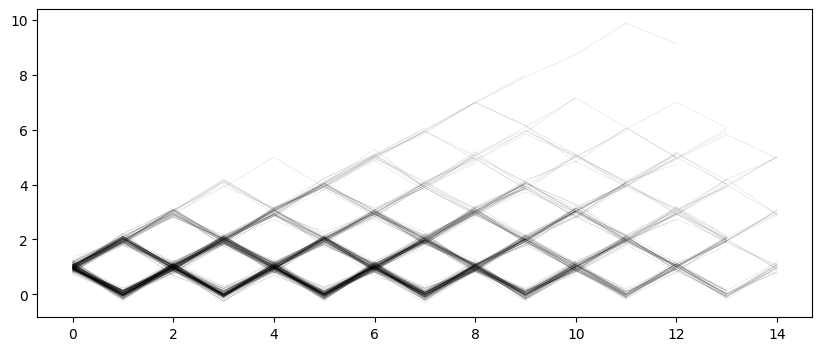


segment 10: 1.10, 2.49
last open = 0.636, next open = 0.504, balance: [0. 1. 1. 2. 4.] mean = 1.768, length = [ 8. 10. 12. 14. 15.] mean = 11.656
prefix (full) 2914 [('<216', 0.004), ('<114', 0.004), ('<117', 0.004), ('<191', 0.004), ('<58', 0.004), ('<8', 0.004), ('<43', 0.004), ('<70', 0.004), ('<228', 0.004), ('<142', 0.004)]
prefix (last) 250 [('<79', 0.012), ('<18', 0.012), ('24>', 0.012), ('<46', 0.012), ('216>', 0.012), ('<154', 0.012), ('<236', 0.008), ('82>', 0.008), ('<233', 0.008), ('<74', 0.008)]
suffix (first) 250 [('<159', 0.012), ('<222', 0.012), ('46>', 0.012), ('<53', 0.012), ('<218', 0.012), ('<117', 0.008), ('233>', 0.008), ('74>', 0.008), ('27>', 0.008), ('<45', 0.008)]


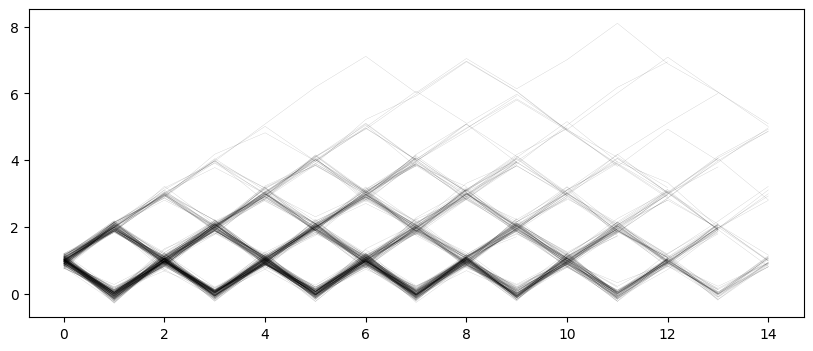


segment 11: 2.49, 4.01
last open = 0.604, next open = 0.468, balance: [0. 1. 2. 3. 4.] mean = 2.096, length = [ 8. 10. 12. 14. 15.] mean = 11.704
prefix (full) 2926 [('<188', 0.005), ('<97', 0.004), ('188>', 0.004), ('<238', 0.004), ('<147', 0.004), ('<213', 0.004), ('<74', 0.004), ('<8', 0.004), ('<224', 0.004), ('<45', 0.004)]
prefix (last) 250 [('97>', 0.02), ('<230', 0.016), ('201>', 0.012), ('27>', 0.012), ('<66', 0.012), ('<50', 0.012), ('<170', 0.012), ('177>', 0.012), ('<59', 0.012), ('56>', 0.008)]
suffix (first) 250 [('<67', 0.012), ('34>', 0.012), ('203>', 0.012), ('214>', 0.012), ('86>', 0.008), ('<127', 0.008), ('<107', 0.008), ('11>', 0.008), ('66>', 0.008), ('<137', 0.008)]


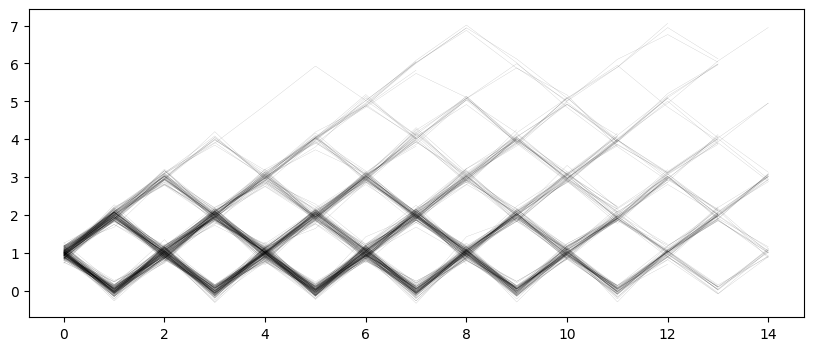


segment 12: 4.02, 5.96
last open = 0.568, next open = 0.52, balance: [0. 1. 1. 3. 4.] mean = 1.856, length = [ 8.  9. 11. 13. 15.] mean = 11.384
prefix (full) 2846 [('<76', 0.005), ('<125', 0.005), ('<137', 0.005), ('<1', 0.005), ('137>', 0.005), ('<232', 0.005), ('76>', 0.005), ('<196', 0.005), ('<242', 0.005), ('<98', 0.004)]
prefix (last) 250 [('<125', 0.016), ('<127', 0.016), ('137>', 0.016), ('148>', 0.012), ('<14', 0.012), ('167>', 0.012), ('177>', 0.008), ('246>', 0.008), ('166>', 0.008), ('<25', 0.008)]
suffix (first) 250 [('125>', 0.012), ('<48', 0.012), ('<194', 0.012), ('<6', 0.012), ('<111', 0.012), ('117>', 0.012), ('<100', 0.012), ('<64', 0.008), ('240>', 0.008), ('191>', 0.008)]


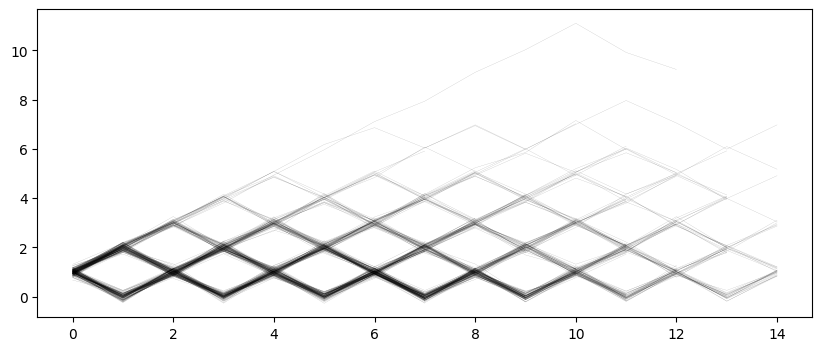


segment 13: 5.96, 8.52
last open = 0.576, next open = 0.492, balance: [0.  1.  1.5 3.  4. ] mean = 1.98, length = [ 9. 10. 12. 14. 15.] mean = 11.78
prefix (full) 2945 [('<16', 0.005), ('<56', 0.005), ('<232', 0.004), ('<215', 0.004), ('<217', 0.004), ('<174', 0.004), ('<3', 0.004), ('<160', 0.004), ('<200', 0.004), ('<40', 0.004)]
prefix (last) 250 [('<56', 0.016), ('<213', 0.012), ('166>', 0.012), ('17>', 0.012), ('<140', 0.012), ('<117', 0.012), ('<186', 0.012), ('<245', 0.012), ('<214', 0.008), ('<180', 0.008)]
suffix (first) 250 [('<122', 0.016), ('<126', 0.012), ('214>', 0.008), ('<245', 0.008), ('<217', 0.008), ('<77', 0.008), ('<100', 0.008), ('<81', 0.008), ('<23', 0.008), ('239>', 0.008)]


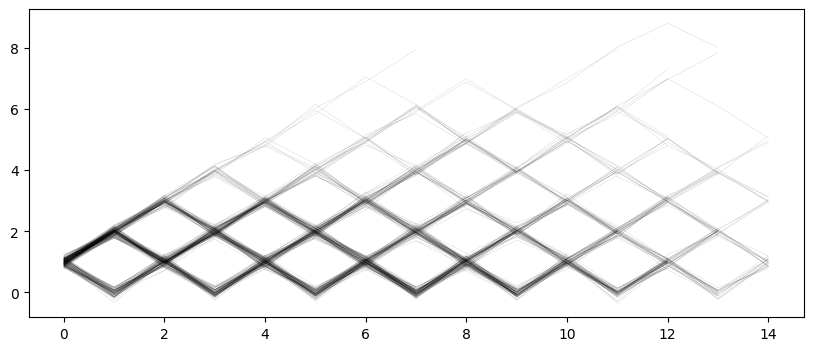


segment 14: 8.55, 13.32
last open = 0.568, next open = 0.576, balance: [0. 0. 1. 3. 4.] mean = 1.884, length = [ 8.  9. 11. 13. 15.] mean = 11.236
prefix (full) 2809 [('<144', 0.005), ('<1', 0.005), ('144>', 0.005), ('1>', 0.004), ('<239', 0.004), ('<40', 0.004), ('<110', 0.004), ('<86', 0.004), ('<69', 0.004), ('<228', 0.004)]
prefix (last) 250 [('66>', 0.012), ('1>', 0.008), ('<228', 0.008), ('17>', 0.008), ('<94', 0.008), ('<5', 0.008), ('<83', 0.008), ('<62', 0.008), ('48>', 0.008), ('<227', 0.008)]
suffix (first) 250 [('91>', 0.02), ('<142', 0.02), ('<204', 0.016), ('<101', 0.012), ('<224', 0.012), ('<215', 0.012), ('86>', 0.012), ('<140', 0.012), ('<71', 0.012), ('<66', 0.012)]


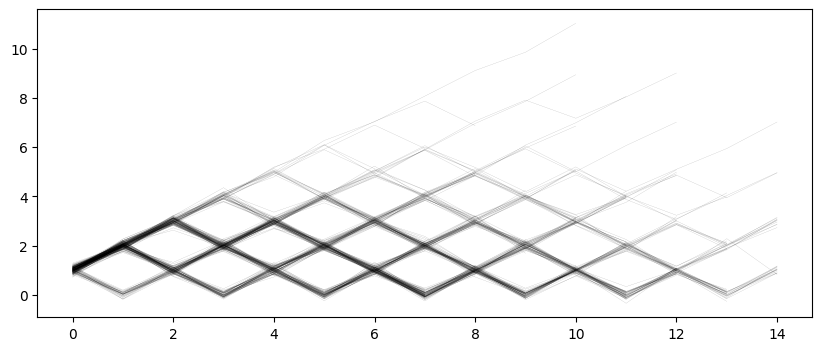


segment 15: 13.34, 81.42
last open = 0.272, next open = 0.508, balance: [0. 1. 1. 2. 3.] mean = 1.452, length = [ 8.  9. 11. 13. 15.] mean = 11.316
prefix (full) 2829 [('<102', 0.005), ('<20', 0.004), ('<153', 0.004), ('<81', 0.004), ('<180', 0.004), ('<124', 0.004), ('<170', 0.004), ('<77', 0.004), ('<28', 0.004), ('<191', 0.004)]
prefix (last) 250 [('29>', 0.012), ('6>', 0.012), ('88>', 0.012), ('124>', 0.012), ('128>', 0.012), ('<170', 0.008), ('<124', 0.008), ('13>', 0.008), ('102>', 0.008), ('141>', 0.008)]
suffix (first) 250 [('<144', 0.012), ('180>', 0.012), ('124>', 0.012), ('171>', 0.012), ('84>', 0.012), ('192>', 0.012), ('170>', 0.008), ('<127', 0.008), ('130>', 0.008), ('<57', 0.008)]


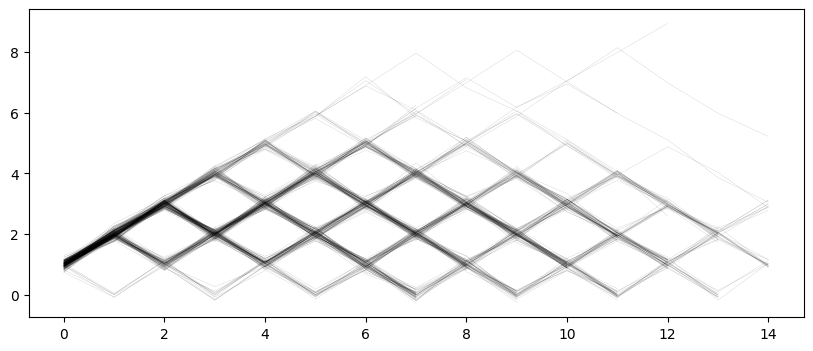

In [342]:
from language_modeling import get_balances
from collections import Counter

segments = 16
for segment in range(segments):
    l, r = segment * len(perm) // segments, (segment + 1) * len(perm) // segments
    prefix_ends_open = []
    suffix_starts_open = []
    prefix_balance = []
    prefix_length = []
    feature_values = []
    prefix_tokens = Counter()
    last_tokens = Counter()
    suffix_tokens = Counter()
    plt.figure(figsize=(10, 4))
    for i_prefix in perm[l:r]:
        balances = get_balances(prefixes[i_prefix])
        plt.plot(balances + t.randn(len(balances)) * 0.1, lw=0.1, alpha=0.5, c="k")
        feature_values.append(values[i_prefix].item())
        prefix_balance.append(balances[-1].item())
        prefix_length.append(len(tokenizer.tokenize(prefixes[i_prefix])))
        suffix_starts_open.append(suffixes[i_prefix].startswith("<"))
        prefix_ends_open.append(not prefixes[i_prefix].endswith(">"))
        prefix_tokens.update(tokenizer.tokenize(prefixes[i_prefix]))
        last_tokens.update(tokenizer.tokenize(prefixes[i_prefix])[-1:])
        suffix_tokens.update(tokenizer.tokenize(suffixes[i_prefix])[:1])
    avg = lambda x: sum(x) / len(x)
    Counter.get_freqs = lambda self: [
        (k, round(v / self.total(), 3)) for k, v in self.most_common(10)
    ]
    print(f"segment {segment}: {ls(min(feature_values))}, {ls(max(feature_values))}")
    # idx_to_check = [
    #     tokenizer.encode(s)[0] for s in ["<4", "4>", "<8", "8>", "<12", "12>"]
    # ]
    # print(
    #     *idx_to_check, ":", tokenizer.decode(idx_to_check), ":", *[suffix_tokens[i] for i in idx_to_check]
    # )
    print(
        f"last open = {avg(prefix_ends_open)}, next open = {avg(suffix_starts_open)}, balance: {np.quantile(prefix_balance, [0.1, 0.25, 0.5, 0.75, 0.9])} mean = {avg(prefix_balance)}, length = {np.quantile(prefix_length, [0.1, 0.25, 0.5, 0.75, 0.9])} mean = {avg(prefix_length)}"
    )
    print("prefix (full)", prefix_tokens.total(), prefix_tokens.get_freqs())
    print("prefix (last)", last_tokens.total(), last_tokens.get_freqs())
    print("suffix (first)", suffix_tokens.total(), suffix_tokens.get_freqs())
    plt.show()
    print()

In [ ]:
X_reg = []
Y_reg = []

for i_prefix in tqdm(range(len(prefixes))):
    tokens = tokenizer.encode(prefixes[i_prefix])
    counts = t.zeros(len(tokenizer))
    for i_token in range(len(tokens)):
        counts[tokens[i_token]] += 1
    last = t.zeros(len(tokenizer))
    last[tokens[-1]] = 1
    n_freqs = 300
    freqs = t.zeros(2 * n_freqs)
    p_len = t.tensor(len(tokens), dtype=t.float32)
    waves = t.logspace(0.0, 9.0, steps=n_freqs, base=2)
    freqs[::2] = t.sin(2 * t.pi * p_len / waves)
    freqs[1::2] = t.cos(2 * t.pi * p_len / waves)
    X_reg.append(t.cat((counts, last, freqs), dim=0))
    Y_reg.append(compressed[i_prefix])

X_reg = t.stack(X_reg)
Y_reg = t.stack(Y_reg)

  0%|          | 0/32000 [00:00<?, ?it/s]

100%|██████████| 32000/32000 [00:07<00:00, 4245.66it/s]


In [ ]:
from sklearn.linear_model import Ridge
from activation_analysis import fit_linear, fit_module
from sparse_autoencoders import random_ortho


@typed
def orth_linear(n: int, m: int) -> nn.Linear:
    result = nn.Linear(n, m)
    result.weight.data = random_ortho(m, n)
    return result


# reg = nn.Sequential(fit_linear(X_reg, Y_reg, reg="l2", alpha=1e-4), nn.ReLU()) # nn.LeakyReLU(negative_slope=0.01))
# reg = nn.Sequential(
#     nn.Linear(1604, 128),
#     nn.LayerNorm(128, elementwise_affine=False, bias=False),
#     nn.Linear(128, 64),
#     nn.LeakyReLU(negative_slope=0.001),
# )
fit_module(reg, X_reg, Y_reg, lr=1e-3, l1=1e-3, batch_size=512, epochs=40)

100%|██████████| 40/40 [00:29<00:00,  1.34it/s,  loss: 0.53]


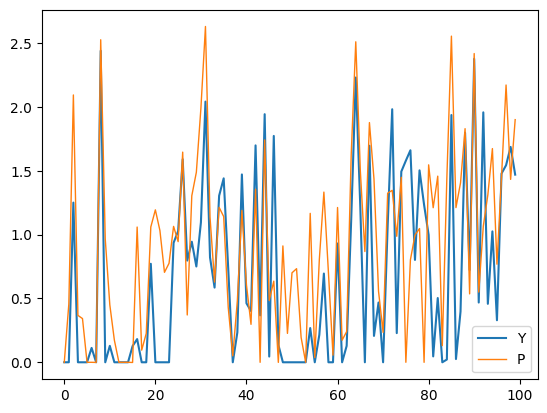

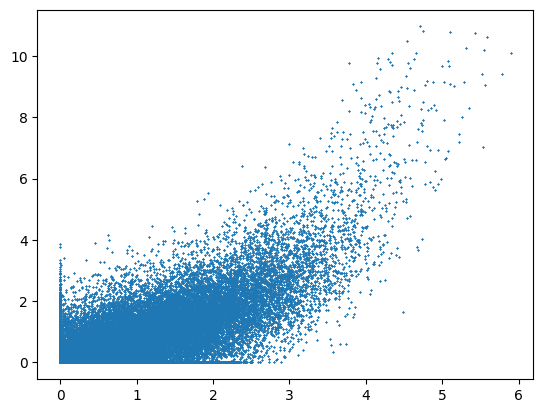

In [ ]:
P_reg = reg(X_reg).detach()



@typed
def explore_dim(dim: int) -> None:
    k = 10**2
    plt.plot(Y_reg[:k, dim], label="Y")
    plt.plot(P_reg[:k, dim], label="P", lw=1)
    plt.legend()
    plt.show()
    plt.plot(P
_reg[:, dim], Y_reg[:, dim], "x", ms=1)
    plt.show()


explore_dim(11)

In [ ]:
from sklearn.metrics import r2_score

for i_prefix in std_argsort:
    y = Y_reg[:, i_prefix]
    p = P_reg[:, i_prefix]
    # c = reg[0].weight.detach()[i_prefix]
    # c[:500] *= ((-1) ** np.arange(500))
    print(ls(i_prefix), ls(stds[i_prefix]), ls(r2_score(y, p)), sep="\t", end="\t")
    print()

2	8.57	0.97	
29	7.10	0.97	
51	5.27	0.96	
27	4.53	0.97	
21	4.37	0.95	
48	4.29	0.97	
34	4.09	0.98	
18	3.77	0.96	
54	3.74	0.97	
13	3.55	0.96	
6	3.51	0.96	
56	3.47	0.96	
43	3.45	0.87	
49	3.44	0.95	
8	3.35	0.97	
52	3.19	0.94	
28	3.17	0.87	
1	3.14	0.97	
5	3.04	0.97	
26	3.02	0.95	
58	3.02	0.95	
53	2.93	0.90	
22	2.89	0.96	
10	2.89	0.97	
17	2.87	0.97	
0	2.83	0.91	
23	2.82	0.97	
47	2.80	0.97	
39	2.78	0.95	
12	2.75	0.95	
62	2.63	0.97	
25	2.54	0.95	
57	2.52	0.97	
14	2.45	0.96	
32	2.25	0.95	
59	2.20	0.88	
9	2.03	0.94	
4	1.98	0.85	
35	1.87	0.94	
44	1.86	0.70	
36	1.84	0.71	
33	1.78	0.81	
40	1.77	0.72	
50	1.70	0.69	
20	1.56	0.61	
60	1.55	0.57	
46	1.53	0.67	
38	1.52	0.86	
30	1.35	0.61	
61	1.17	0.59	
11	1.16	0.48	
41	1.16	0.76	
63	0.94	0.78	
16	0.93	0.63	
42	0.84	0.68	
24	0.84	0.50	
55	0.81	0.68	
15	0.76	0.66	
31	0.73	0.79	
19	0.00	0.00	
45	0.00	0.00	
7	0.00	0.00	
37	0.00	0.00	
3	0.00	0.00	


In [ ]:
@typed
def perm_importance(in_feature: int, k: int = 3) -> Float[TT, "out_features"]:
    result = 0
    for _ in range(k):
        X_new = X_reg.clone()
        X_new[:, in_feature] = X_new[:, in_feature][t.randperm(X_new.shape[0])]
        pred = reg(X_new).detach()
        scores = [r2_score(Y_reg[:, i], pred[:, i]) for i in std_argsort]
        result += t.tensor(scores)
    return result / k



composite = (reg[2].weight @ reg[0].weight).clone().detach()
composite /= composite.std(dim=1, keepdim=True)
print(sh(composite))

[64, 1604]


In [ ]:
for i in std_argsort:
    a = composite[i, :500].std()
    b = composite[i, 500:1000].std()
    cosd_pe = composite[i, 1000:].std()
    print(ls(i), "\t", ls(a), ls(b), ls(cosd_pe))

2 	 1.77 0.26 0.03
29 	 0.78 1.59 0.18
51 	 1.70 0.56 0.05
27 	 1.77 0.20 0.03
21 	 1.69 0.58 0.05
48 	 1.75 0.39 0.03
34 	 1.74 0.43 0.04
18 	 1.73 0.47 0.04
54 	 1.73 0.48 0.04
13 	 1.75 0.39 0.04
6 	 1.70 0.55 0.04
56 	 1.72 0.51 0.04
43 	 1.57 0.86 0.07
49 	 1.70 0.56 0.04
8 	 1.76 0.35 0.04
52 	 1.67 0.66 0.05
28 	 1.50 0.98 0.05
1 	 1.72 0.52 0.05
5 	 1.74 0.41 0.04
26 	 1.65 0.69 0.05
58 	 1.67 0.64 0.04
53 	 1.67 0.63 0.07
22 	 1.71 0.51 0.09
10 	 1.73 0.48 0.05
17 	 1.75 0.40 0.03
0 	 1.63 0.72 0.07
23 	 1.72 0.50 0.05
47 	 1.73 0.45 0.04
39 	 1.72 0.51 0.05
12 	 1.69 0.59 0.04
62 	 1.75 0.37 0.04
25 	 1.69 0.58 0.10
57 	 1.71 0.52 0.04
14 	 1.71 0.54 0.04
32 	 1.66 0.67 0.04
59 	 1.66 0.68 0.05
9 	 1.64 0.71 0.06
4 	 1.63 0.73 0.09
35 	 1.66 0.68 0.05
44 	 1.48 0.99 0.07
36 	 1.55 0.89 0.07
33 	 1.60 0.81 0.07
40 	 1.42 1.09 0.05
50 	 1.46 1.03 0.07
20 	 1.40 1.11 0.07
60 	 1.29 1.24 0.05
46 	 1.31 1.22 0.05
38 	 1.54 0.92 0.05
30 	 1.32 1.20 0.12
61 	 1.12 1.40 0.06
11 	 1.3

In [ ]:
from activation_analysis import compressed_activations

for feature in std_argsort[:10]:
    plt.figure(figsize=(10, 5))
    for _ in tqdm(range(300)):
        user_input = prompt_from_template("(())(((())))(((())))((()))(())", random=True)
        cur = compressed_activations(model, tokenizer, user_input, {layer: sae})[layer]
        normalized = cur[:, feature] / stds[feature]
        plt.plot(normalized, lw=0.1, alpha=0.1, c="k")
    plt.show()

<10 <11 <12 <13 13> 12> 11> 10> <8 <7 <6 6> 7> 8> <184 <156 156> 184> <15 <224 224> 15> <238 <130 130> 238>
407: [ 359.55 185.92 150.15 117.54 79.06 53.47 90.30 27.75 12.79 1.64 6.19 6.03 10.52 13.32 12.97 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 ]


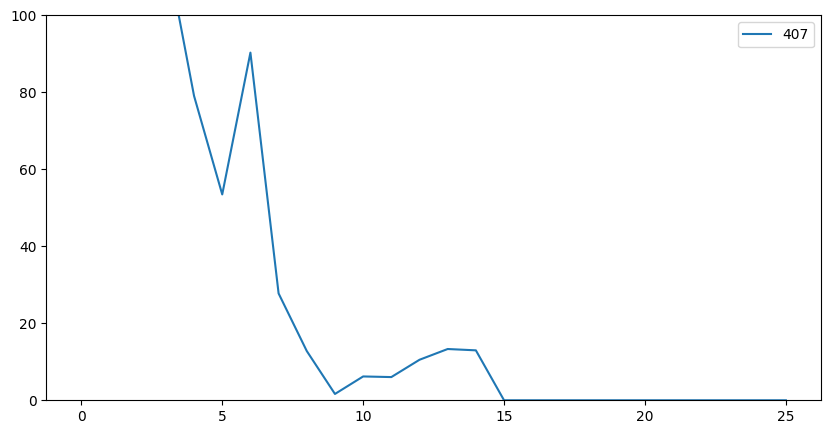

In [438]:
@typed
def explore_input(user_input: str, features: list[int]) -> None:
    if any(x >= len(tokenizer) - 2 for x in tokenizer.encode(user_input)):
        print("Invalid input. Please try again.")
    _, full_activations = get_activations(model, tokenizer, user_input)
    tokens = tokenizer.tokenize(user_input)
    kf = t.stack(
        [get_known_features(" ".join(tokens[:pr])) for pr in range(1, len(tokens) + 1)]
    )
    activations = squeeze_batch(full_activations[layer]).detach()
    residuals = activations - K2A(kf).detach()
    cur = sae.encode(residuals).detach()
    plt.figure(figsize=(10, 5))
    plt.ylim(0, 100)
    print(user_input)
    for feature in features:
        normalized = cur[:, feature]
        print(f"{feature}: {ls(normalized)}")
        plt.plot(normalized, label=feature)
    plt.legend()
    plt.show()


features = [407]
# prompt = "<1 <2 <3 <4 4> 3> 2> 1> <5 <7 <8 8> 7> 5>"
# prompt = prompt_from_template("(((())))((()))", random=True)
prompt = "<10 <11 <12 <13 13> 12> 11> 10> <8 <7 <6 6> 7> 8> <184 <156 156> 184> <15 <224 224> 15> <238 <130 130> 238>"
explore_input(prompt, features)